# 图像处理(利用索伯算子和卷积)

目的：通过一系列流程，适当去掉图像中信息含量较小的部分，缩小图像。

## 导入包


In [2]:
using Images
using ImageFiltering
using ImageView
using LinearAlgebra
using TestImages

In [3]:
image_url = "https://game.gtimg.cn/images/lol/universe/v1/assets/images/star03banner.jpg" 
#image_url = "https://game.gtimg.cn/images/lol/universe/v1/assets/images/champion/splash/Viego_0.jpg"

"https://game.gtimg.cn/images/lol/universe/v1/assets/images/star03banner.jpg"

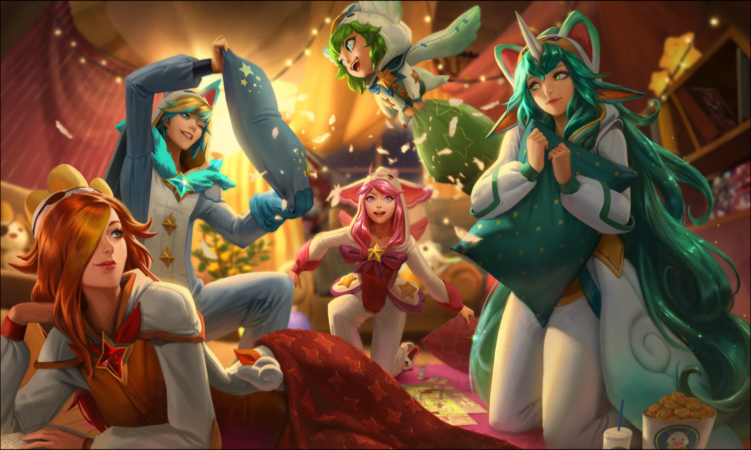

In [4]:
img = load(download(image_url))

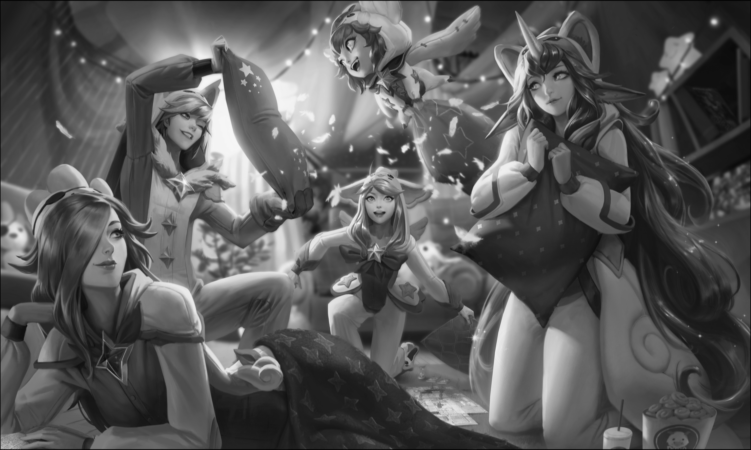

In [5]:
Gray.(img)

## Sobel filters
现在我们寻找图像的边缘
Sobel edge detection filter:

$$
\begin{align}
G_x &= \begin{bmatrix}
1 & 0 & -1 \\
2 & 0 & -2 \\
1 & 0 & -1 \\
\end{bmatrix}*A
\end{align}
$$

$$
\begin{align}
G_y &= \begin{bmatrix}
1 & 2 & 1 \\
0 & 0 & 0 \\
-1 & -2 & -1 \\
\end{bmatrix}*A
\end{align}
$$

$A$代表我们需要处理的图像.可以看成分别在$x$和$y$方向上，然后计算梯度。


$$G_\text{total} = \sqrt{G_x^2 + G_y^2}.$$

In [6]:
?Kernel.sobel()

```julia
    diff1, diff2 = sobel()
```

Return $3 \times 3$ correlation kernels for two-dimensional gradient compution using the Sobel operator. The `diff1` kernel computes the gradient along the y-axis (first dimension), and the `diff2` kernel computes the gradient along the x-axis (second dimension). `diff1 == rotr90(diff2)`

```julia
    (diff,) = sobel(extended::NTuple{N,Bool}, d)
```

Return (a tuple of) the N-dimensional correlation kernel for gradient compution along the dimension `d` using the Sobel operator. If `extended[dim]` is false, `diff` will have size 1 along that dimension.

# Citation

P.-E. Danielsson and O. Seger, "Generalized and separable sobel operators," in  *Machine Vision for Three-Dimensional Scenes*,  H. Freeman, Ed.  Academic Press, 1990,  pp. 347–379. [doi:10.1016/b978-0-12-266722-0.50016-6](https://doi.org/doi:10.1016/b978-0-12-266722-0.50016-6)

See also: [`KernelFactors.sobel`](@ref), [`Kernel.prewitt`](@ref), [`Kernel.ando3`](@ref), [`Kernel.scharr`](@ref), [`Kernel.bickley`](@ref) and [`imgradients`](@ref).


In [7]:
Kernel.sobel()

([-0.125 -0.25 -0.125; 0.0 0.0 0.0; 0.125 0.25 0.125], [-0.125 0.0 0.125; -0.25 0.0 0.25; -0.125 0.0 0.125])

In [8]:

Sy, Sx = Kernel.sobel()
SX = collect(Int.(8 .* Sy))
SY = collect(Int.(8 .* Sx))

3×3 Array{Int64,2}:
 -1  0  1
 -2  0  2
 -1  0  1

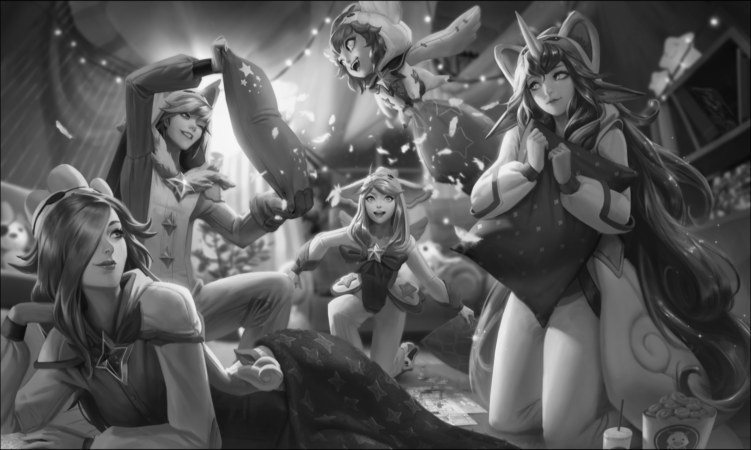

In [9]:
#显示人物边缘
#为什么要写bright function可以看： https://www.tutorialspoint.com/dip/grayscale_to_rgb_conversion.html
bright(c::AbstractRGB) = 0.3 * c.r + 0.59 * c.g + 0.11 * c.b
img_bright = bright.(img)
Gray.(img_bright)

In [10]:
#卷积
function convolve(M, kernel)
    height, width = size(kernel)
    
    half_height = height ÷ 2
    half_width = width ÷ 2
    
    new_image = similar(M)
	
    # (i, j) loop over the original image
	m, n = size(M)
    @inbounds for i in 1:m
        for j in 1:n
            # (k, l) loop over the neighbouring pixels
			accumulator = 0 * M[1, 1]
			for k in -half_height:-half_height + height - 1
				for l in -half_width:-half_width + width - 1
					Mi = i - k
					Mj = j - l
					# First index into M
					if Mi < 1
						Mi = 1
					elseif Mi > m
						Mi = m
					end
					# Second index into M
					if Mj < 1
						Mj = 1
					elseif Mj > n
						Mj = n
					end
					
					accumulator += kernel[k, l] * M[Mi, Mj]
				end
			end
			new_image[i, j] = accumulator
        end
    end
    
    return new_image
end

convolve (generic function with 1 method)

In [11]:
function show_colored_array(array)
	pos_color = RGB(0.3, 0.7, 0.9)
	neg_color = RGB(0.9, 0.1, 0.1)
	to_rgb(x) = max(x, 0) * pos_color + max(-x, 0) * neg_color
	to_rgb.(array) / maximum(abs.(array))
end

show_colored_array (generic function with 1 method)

In [12]:
function hbox(x, y, gap=10; sy=size(y), sx=size(x))
	w,h = (max(sx[1], sy[1]),
		   gap + sx[2] + sy[2])
	
	pict = fill(RGB(1,1,1), w,h)
	pict[1:size(x,1), 1:size(x,2)] .= RGB.(x)
	pict[1:size(y,1), size(x,2) + gap .+ (1:size(y,2))] .= RGB.(y)
	pict
end

hbox (generic function with 2 methods)

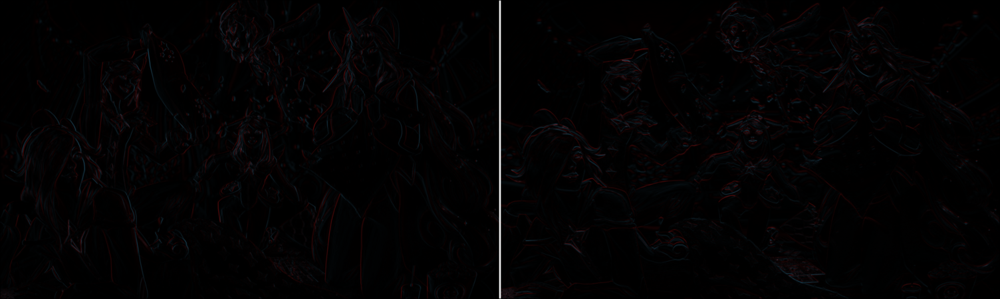

In [13]:
∇x = convolve(img_bright, Sx)
∇y = convolve(img_bright, Sy)
hbox(show_colored_array(∇x), show_colored_array(∇y))

In [14]:
function edgeness(img)
	Sy, Sx = Kernel.sobel()
	b = bright.(img)

	∇y = convolve(b, Sy)
	∇x = convolve(b, Sx)

	sqrt.(∇x.^2 + ∇y.^2)
end

edgeness (generic function with 1 method)

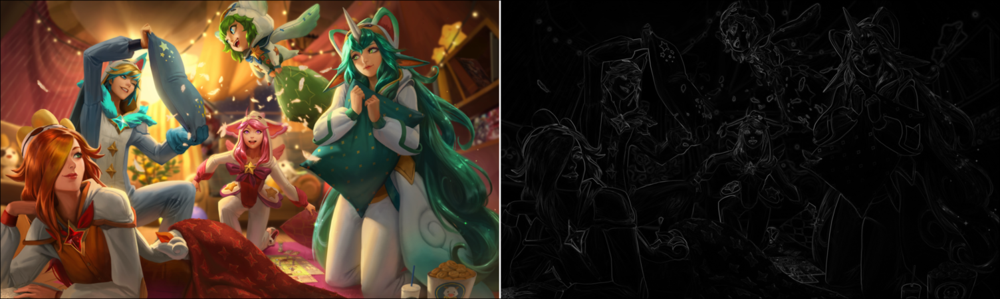

In [15]:
edged = edgeness(img)
hbox(img, Gray.(edgeness(img)) / maximum(abs.(edged)))

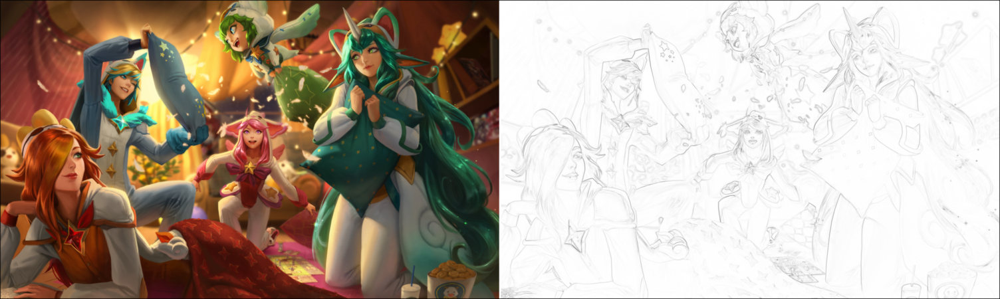

In [16]:
#铅笔画
function pencil(X)
	f(x) = RGB(1-x,1-x,1-x)
	map(f, X ./ maximum(X))
end
hbox(img, pencil(edged))

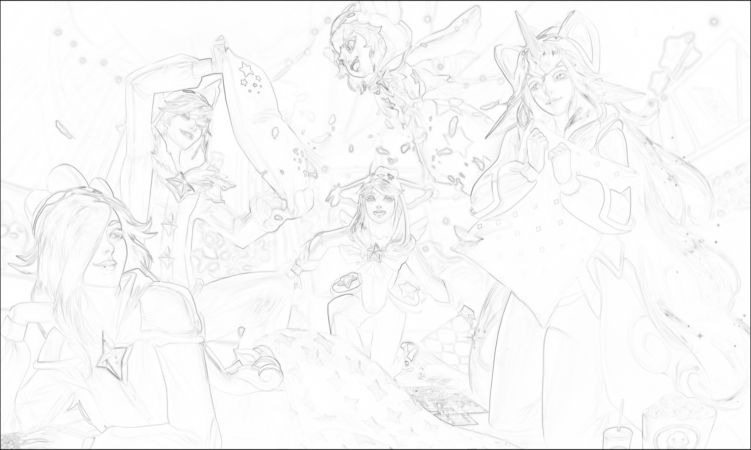

In [17]:
pencil(edged)

**********
## 压缩
选择的分割线需要按梯度下降，从图像的顶到底部，寻找到梯度最小的路径。


In [18]:
function least_edge(Edge)
	least_E = zeros(size(Edge))
	dirs = zeros(Int, size(Edge))
    least_E[end, :] .= Edge[end, :] 

	m, n = size(Edge)
	for i in m-1:-1:1
		for j in 1:n
			j1, j2 = max(1, j-1), min(j+1, n)
			e, dir = findmin(least_E[i+1, j1:j2])
			least_E[i,j] += e
			least_E[i,j] += Edge[i,j]
			dirs[i, j] = (-1,0,1)[dir + (j==1)]
		end
	end
	least_E, dirs
end

least_edge (generic function with 1 method)

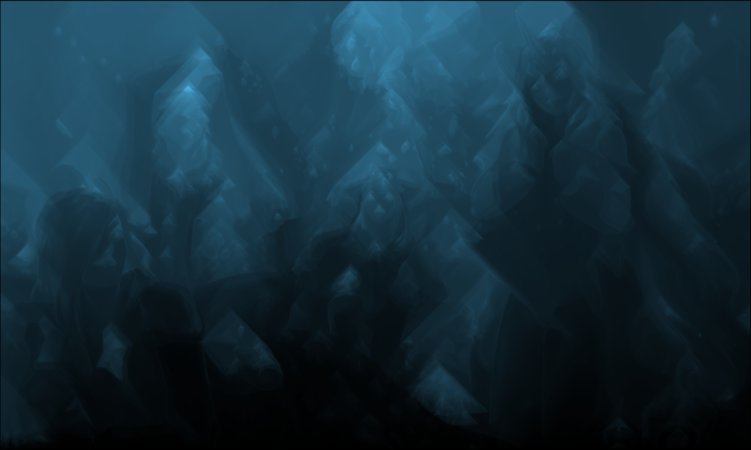

In [39]:
least_e, dirs = least_edge(edgeness(img))
show_colored_array(least_e)

In [40]:
getindex.(([" ", "↙", "↓", "↘"],), dirs[1:25, 1:60].+3)

25×60 Array{String,2}:
 "↘"  "↘"  "↘"  "↓"  "↘"  "↓"  "↙"  "↙"  …  "↙"  "↙"  "↙"  "↙"  "↙"  "↘"  "↘"
 "↘"  "↘"  "↘"  "↘"  "↓"  "↘"  "↓"  "↙"     "↙"  "↙"  "↙"  "↙"  "↙"  "↙"  "↘"
 "↓"  "↙"  "↘"  "↘"  "↘"  "↘"  "↘"  "↓"     "↓"  "↙"  "↙"  "↙"  "↙"  "↙"  "↘"
 "↓"  "↙"  "↙"  "↘"  "↘"  "↘"  "↓"  "↘"     "↘"  "↓"  "↙"  "↙"  "↙"  "↙"  "↘"
 "↘"  "↓"  "↙"  "↘"  "↘"  "↘"  "↘"  "↓"     "↙"  "↘"  "↓"  "↙"  "↙"  "↙"  "↙"
 "↘"  "↘"  "↘"  "↓"  "↙"  "↘"  "↘"  "↘"  …  "↙"  "↙"  "↘"  "↘"  "↓"  "↙"  "↙"
 "↘"  "↘"  "↘"  "↓"  "↙"  "↘"  "↘"  "↘"     "↙"  "↙"  "↙"  "↘"  "↓"  "↙"  "↙"
 "↘"  "↘"  "↘"  "↓"  "↙"  "↘"  "↘"  "↘"     "↙"  "↙"  "↙"  "↙"  "↘"  "↘"  "↓"
 "↘"  "↘"  "↘"  "↘"  "↓"  "↙"  "↘"  "↘"     "↙"  "↙"  "↙"  "↙"  "↘"  "↘"  "↓"
 "↘"  "↘"  "↘"  "↓"  "↙"  "↙"  "↘"  "↘"     "↙"  "↙"  "↙"  "↙"  "↘"  "↘"  "↘"
 "↘"  "↘"  "↘"  "↓"  "↙"  "↘"  "↘"  "↘"  …  "↙"  "↙"  "↙"  "↙"  "↘"  "↘"  "↓"
 "↓"  "↘"  "↘"  "↘"  "↘"  "↘"  "↘"  "↓"     "↙"  "↙"  "↙"  "↙"  "↘"  "↘"  "↓"
 "↘"  "↘"  "↘"  "↘"  "↘"  "↘"  "↘"  "↓"  

In [41]:
reduce((x,y)->x*y*"\n",
	reduce(*, getindex.(([" ", "↙", "↓", "↘"],), dirs[1:25, 1:60].+3), dims=2, init=""), init="") |> Text

↘↘↘↓↘↓↙↙↘↘↓↙↘↘↘↘↘↘↘↘↘↘↘↘↘↓↘↓↘↘↘↓↙↙↙↙↙↙↙↙↙↘↓↘↓↘↘↘↘↘↘↓↙↙↙↙↙↙↘↘
↘↘↘↘↓↘↓↙↘↓↙↙↘↓↘↘↘↘↘↘↘↘↘↘↘↓↙↘↘↘↘↓↙↙↙↙↙↙↙↙↙↘↘↓↘↘↘↓↙↘↘↘↓↙↙↙↙↙↙↘
↓↙↘↘↘↘↘↓↙↙↙↘↘↘↘↘↘↘↘↘↘↘↘↘↘↓↙↘↘↘↘↓↙↙↙↙↙↙↙↙↙↙↘↘↘↘↓↙↙↘↘↓↘↓↙↙↙↙↙↘
↓↙↙↘↘↘↓↘↓↘↘↘↓↘↘↓↘↘↘↘↘↘↘↘↘↘↓↘↘↘↘↓↙↙↙↙↙↙↙↙↙↘↘↘↘↘↓↙↙↘↘↓↙↘↓↙↙↙↙↘
↘↓↙↘↘↘↘↓↘↘↘↘↓↙↘↘↓↘↘↘↘↘↘↘↘↘↘↘↘↘↘↓↙↙↙↙↙↙↙↙↙↓↘↘↘↓↙↙↙↘↘↓↙↙↘↓↙↙↙↙
↘↘↘↓↙↘↘↘↘↘↘↘↓↙↘↘↓↙↓↘↘↘↘↘↘↘↘↘↓↘↘↓↙↙↙↙↙↙↙↙↘↓↘↘↘↓↙↙↙↘↘↓↙↙↙↘↘↓↙↙
↘↘↘↓↙↘↘↘↘↘↘↓↙↙↘↘↓↙↓↙↘↘↘↘↘↘↘↓↙↘↘↓↙↙↙↙↙↙↙↙↙↘↘↘↘↘↓↙↙↘↘↓↙↙↙↙↘↓↙↙
↘↘↘↓↙↘↘↘↘↘↘↘↓↙↘↘↓↙↘↘↘↘↘↘↘↓↘↘↘↘↘↘↓↙↙↙↙↙↙↙↙↘↘↓↘↘↘↓↙↘↘↓↙↙↙↙↙↘↘↓
↘↘↘↘↓↙↘↘↘↘↘↓↙↙↘↘↓↙↘↘↓↙↘↘↘↓↙↘↘↓↙↙↘↓↙↙↙↙↙↙↙↘↘↘↓↘↘↓↙↙↙↙↙↙↙↙↙↘↘↓
↘↘↘↓↙↙↘↘↘↘↘↓↘↘↓↙↙↓↙↘↓↙↘↘↘↓↙↘↘↘↓↙↙↘↓↙↙↙↙↙↙↘↘↘↓↘↘↓↙↙↙↙↙↙↙↙↙↘↘↘
↘↘↘↓↙↘↘↘↘↘↘↘↘↘↓↙↙↓↙↘↓↙↘↘↘↓↙↘↘↘↘↓↙↙↘↓↙↙↙↙↙↘↘↘↓↘↘↓↙↙↙↙↙↙↙↙↙↘↘↓
↓↘↘↘↘↘↘↓↘↘↘↘↘↓↙↙↙↙↙↘↓↙↘↘↘↓↙↘↘↘↘↘↓↙↙↘↓↙↙↙↙↘↘↘↓↘↘↓↙↙↙↙↙↙↙↙↙↘↘↓
↘↘↘↘↘↘↘↓↙↘↘↘↓↙↙↙↙↘↓↙↘↓↘↘↘↓↙↘↘↓↘↘↘↓↙↙↘↓↙↙↙↘↘↘↓↘↘↓↙↙↙↘↓↙↙↙↙↙↘↓
↘↘↘↘↓↘↘↓↙↘↘↓↙↙↙↙↙↘↘↓↙↘↓↘↘↘↓↘↘↓↙↘↘↘↓↙↙↘↓↙↙↘↘↘↓↘↘↓↙↙↙↙↘↓↙↙↙↙↙↓
↓↙↘↘↘↓↘↓↙↘↘↘↘↘↓↙↘↘↘↘↓↙↘↓↙↘↘↘↘↓↙↙↘↘↘↓↙↙↘↓↘↘↘↘↘↘↘↓↙↙↙↙↙↘↓↘↓↙↘↓
↓↙↘↘↘↘↘↘↘↘↘↘↘↘↓↙↘↓↘↘↓↘↘↓↙↙↘↘↘↓↙↙↘↘↘↓↙↙↙↘↘↘↘↓↙↘↓↘↘↓↙↙↙↙↘↓↙↙↓↙
↘↘↓↘↘↘↘↘↘↓↙↙↘↓↙↘↓↙↘↘↓↘↘↓

In [22]:
function get_path_at(dirs, j)
	m = size(dirs, 1)
	js = fill(0, m)
	js[1] = j
	for i=2:m
		js[i] = js[i-1] + dirs[i-1, js[i-1]]
	end
	tuple.(1:m, js)
end

get_path_at (generic function with 1 method)

In [42]:
#开始那行可以在（1，size(img))之前的任意一点寻找路径
start_column = 1000
path = get_path_at(dirs, start_column)

1794-element Array{Tuple{Int64,Int64},1}:
 (1, 1000)
 (2, 999)
 (3, 998)
 (4, 999)
 (5, 998)
 (6, 997)
 (7, 996)
 (8, 995)
 (9, 996)
 (10, 997)
 (11, 998)
 (12, 997)
 (13, 996)
 ⋮
 (1783, 1241)
 (1784, 1242)
 (1785, 1242)
 (1786, 1243)
 (1787, 1244)
 (1788, 1243)
 (1789, 1242)
 (1790, 1241)
 (1791, 1241)
 (1792, 1242)
 (1793, 1241)
 (1794, 1240)

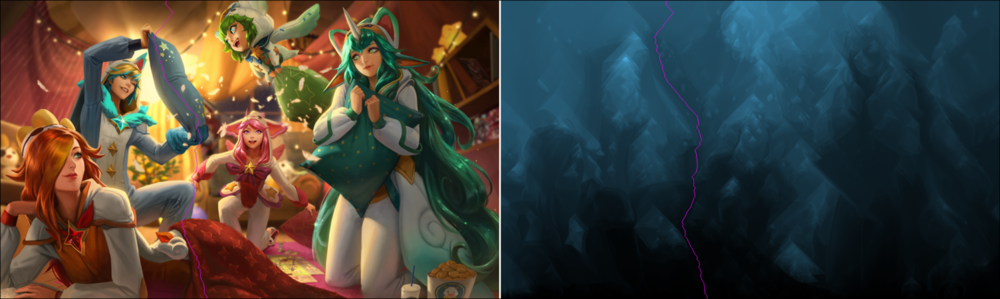

In [43]:
function mark_path(img, path)
	img′ = copy(img)
	m = size(img, 2)
	for (i, j) in path
		# To make it easier to see, we'll color not just
		# the pixels of the seam, but also those adjacent to it
		for j′ in j-1:j+1
			img′[i, clamp(j′, 1, m)] = RGB(1,0,1)
		end
	end
	img′
end
hbox(mark_path(img, path), mark_path(show_colored_array(least_e), path))

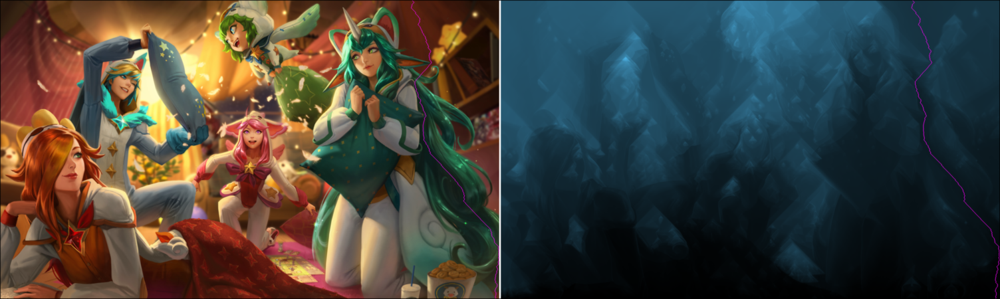

In [45]:
# least energy path of them all:
_, k = findmin(least_e[1, :])
path = get_path_at(dirs, k)
hbox(
	mark_path(img, path),
	mark_path(show_colored_array(least_e), path)
)

In [26]:
function rm_path(img, path)
	img′ = img[:, 1:end-1] # one less column
	for (i, j) in path
		img′[i, 1:j-1] .= img[i, 1:j-1]
		img′[i, j:end] .= img[i, j+1:end]
	end
	img′
end

function shrink_n(img, n)
	imgs = []
	marked_imgs = []

	e = edgeness(img)
	for i=1:n
		least_E, dirs = least_edge(e)
		_, min_j = findmin(@view least_E[1, :])
		path = get_path_at(dirs, min_j)
		img = rm_path(img, path)
		e = rm_path(e, path)

 		push!(imgs, img)
 		push!(marked_imgs, mark_path(img, path))
	end
	imgs, marked_imgs
end

shrink_n (generic function with 1 method)

In [27]:
startp = 100
#收缩n次
n = 500
carved, marked_carved = shrink_n(img, n)

(Any[RGBX{Normed{UInt8,8}}[RGBX{N0f8}(0.184,0.114,0.059) RGBX{N0f8}(0.18,0.11,0.055) … RGBX{N0f8}(0.165,0.086,0.043) RGBX{N0f8}(0.165,0.086,0.043); RGBX{N0f8}(0.184,0.114,0.059) RGBX{N0f8}(0.18,0.11,0.055) … RGBX{N0f8}(0.165,0.086,0.043) RGBX{N0f8}(0.165,0.086,0.043); … ; RGBX{N0f8}(0.894,0.706,0.502) RGBX{N0f8}(0.906,0.714,0.51) … RGBX{N0f8}(0.4,0.188,0.09) RGBX{N0f8}(0.4,0.188,0.09); RGBX{N0f8}(0.878,0.69,0.486) RGBX{N0f8}(0.808,0.647,0.475) … RGBX{N0f8}(0.4,0.188,0.09) RGBX{N0f8}(0.404,0.192,0.094)], RGBX{Normed{UInt8,8}}[RGBX{N0f8}(0.184,0.114,0.059) RGBX{N0f8}(0.18,0.11,0.055) … RGBX{N0f8}(0.165,0.086,0.043) RGBX{N0f8}(0.165,0.086,0.043); RGBX{N0f8}(0.184,0.114,0.059) RGBX{N0f8}(0.18,0.11,0.055) … RGBX{N0f8}(0.165,0.086,0.043) RGBX{N0f8}(0.165,0.086,0.043); … ; RGBX{N0f8}(0.894,0.706,0.502) RGBX{N0f8}(0.906,0.714,0.51) … RGBX{N0f8}(0.4,0.188,0.09) RGBX{N0f8}(0.4,0.188,0.09); RGBX{N0f8}(0.878,0.69,0.486) RGBX{N0f8}(0.808,0.647,0.475) … RGBX{N0f8}(0.4,0.188,0.09) RGBX{N0f8}(0.404,0.

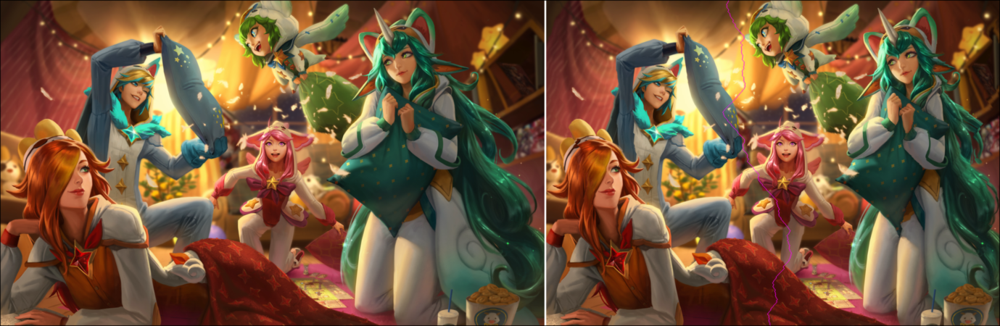

In [38]:
hbox(img, marked_carved[500])

In [29]:
size(marked_carved[100])

(1794, 2900)

In [30]:
3 ÷ 2

1

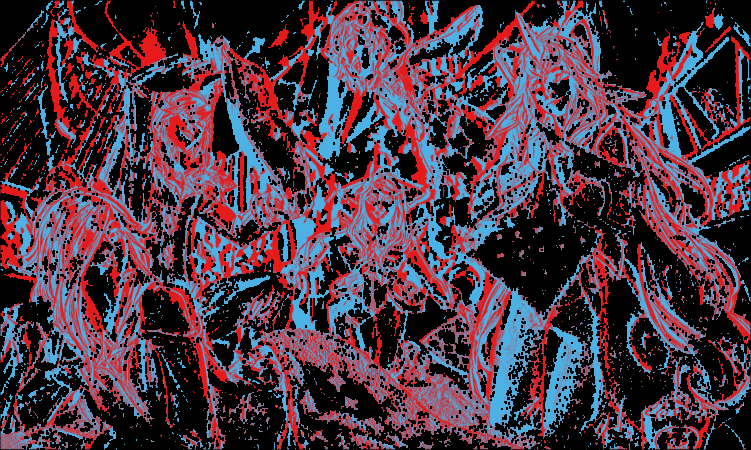

In [31]:
show_colored_array.(∇x)

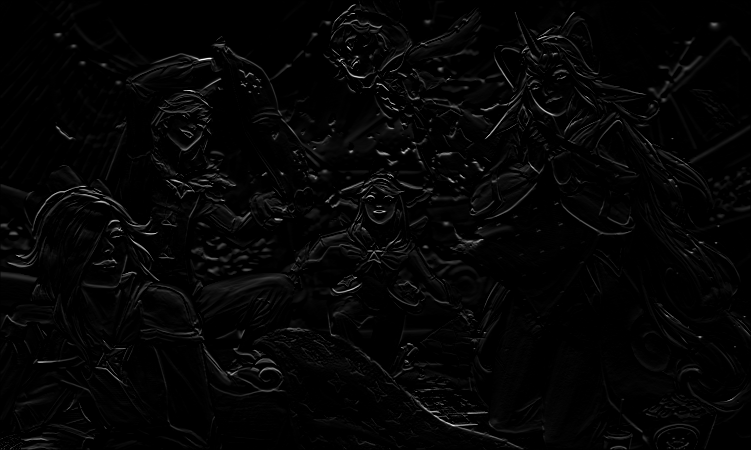

In [32]:
pos_color = RGB(0.76, 0.92, 0.99)
neg_color = RGB(0.99, 0.10, 0.03)
to_rgb(x) = max(x, 0) * pos_color + max(-x, 0) * neg_color
Gray.(3 * (∇y)/maximum(abs.(∇y)))

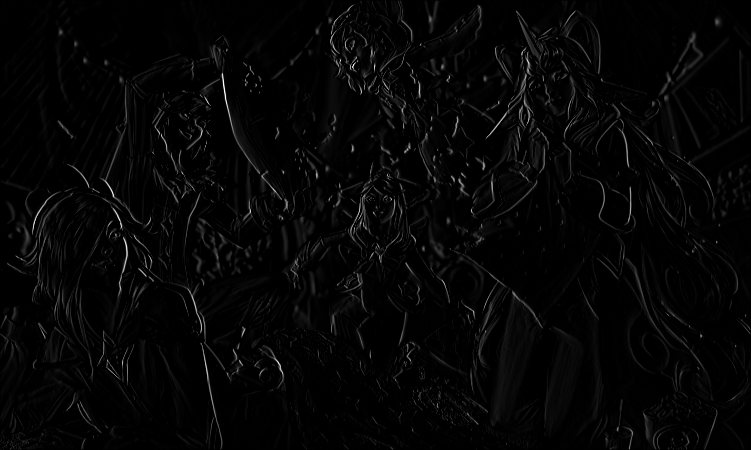

In [33]:
3*Gray.(∇x/maximum(abs.(∇x)))

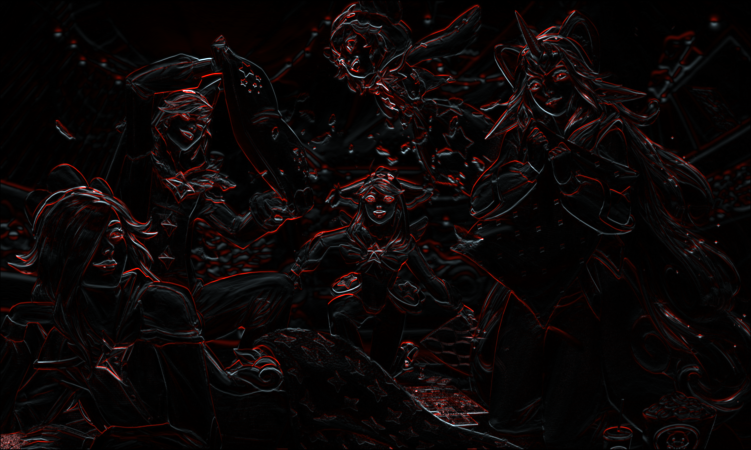

In [34]:
 3 * (to_rgb.(∇y)/maximum(abs.(∇y)))

In [35]:
RGBX(0.9, 0.9, 0.9)

In [36]:
RGB(0.5,0,0)

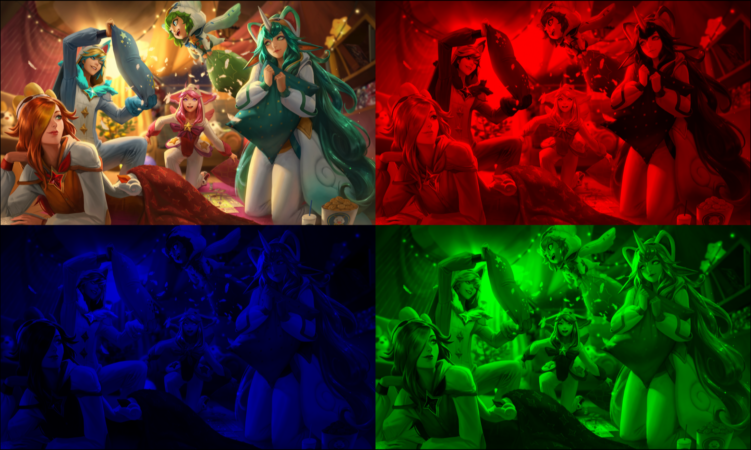

In [37]:
rediy(color::AbstractRGB) = RGB(color.r, 0, 0)
gudiy(color::AbstractRGB) = RGB(0, color.g, 0)
budiy(color::AbstractRGB) = RGB(0, 0, color.b)
[img rediy.(img); budiy.(img) gudiy.(img)]